# Identifying a Soccer-Player's Skills with Gaussian Processes

> PyData NYC 2024 Tutorial

Alex Andorra, Max Goebel

November 6, 2024

## Pre-Game Ramblings

### What's the Soccer-Factor-Model all about?

#### The Inspiration

The Soccer-Factor-Model (SFM) is inspired by the academic literature on asset-pricing along the following lines:

> 1. Factor Models à la [Fama & French](https://onlinelibrary.wiley.com/doi/full/10.1111/j.1540-6261.1992.tb04398.x) use "factors" to explain the cross-section of stock returns. <br>
 --> **here**: we use "Team-Factors" to explain away the role of the team's strength in making a given player $i$ score a goal.

> 2. There is some literature on the skill of investment fund managers that works in a similar way: "explain away" that proportion of a fund's returns that is related to economic fundamentals (e.g. [Coggin, Fabozzi, Rahman (1993)](https://onlinelibrary.wiley.com/doi/10.1111/j.1540-6261.1993.tb04029.x); [Fama & French (2010)](https://onlinelibrary.wiley.com/doi/10.1111/j.1540-6261.2010.01598.x); [Berg & van Binsbergen (2015)](https://www.sciencedirect.com/science/article/pii/S0304405X15000628)):
\begin{align}
  r_{p,t} = \alpha_p + \sum^N_{n=1} \beta_n \, f_{n,t} + \varepsilon_{p,t}
\end{align} <br>
 where $r_{p,t}$ is portfolio $p$'s return in excess of the risk-free rate (e.g. short-term U.S. government bonds). $f_{n,t}$ measures the return that one could generate by following the strategy prescribed by **factor $n$**, and $\varepsilon_{p,t}$ is a random error that is usually assumed to be mean zero. <br> The parameter of interest here is $\mathbf{\alpha_p}$. It is that part of a portfolio's conditional mean, that is not to be explained by the factors $f_{1,t},...,f_{N,t}$, and is a measure of the portfolio manager's **skill/ability**. Said differently: it quantifies the manager's ability to generate returns **beyond** the return you would have received by just following the investment strategy dictated by the factors.

#### From Asset-Pricing to Soccer

In our case, the "dependent variable"/"label"/"outcome variable" ($y_{i,s,m}$) will be a binary indicator, telling us whether player $i$ has scored a goal (or not) in season $s$ in match $m$:

\begin{align}
        y_{i,s,m} = \left\{
        \begin{array}{cl}
        0 & \textbf{not} \text{ scored} \\
        1 & \text{scored}
        \end{array}
        \right.
\end{align}

> *Sidenote*: This binary classification exercise is just a way to keep things simple. One may also want to predict the *number* of goals in a given match, which would make it for a multiclass extension.

The SFM is then set-up as follows:

\begin{align}
     p_{i,s,m} \equiv   P\left(y_{i,s,m} = 1 | \mathbf{x}_{i,s,m-1}, \alpha_i, \beta \right) = \sigma \left(\alpha_{i} + \mathbf{x}_{i,s,m-1} \, \mathbf{\beta} \right) \qquad \left( M.1 \right)
\end{align}

where:

> - $p_{i,s,m}$: &ensp;&ensp;&emsp; The probability of player $i$ scoring a goal in season $s$ in match $m$ *conditional* on $\mathbf{x}_{i,s,m-1}$, $\alpha_i$, and $\beta \;$ ;

> - $\mathbf{x}_{i,s,m-1}$: &emsp; A $\; 1 \times N$ vector of *factors* that are intended to resemble the imbalance between player $i$'s team and the <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; opponent-team. The subscript $m-1$ signals that these *factors* only contain information about the teams' <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; differences that prevail **before** the referee blows the whistle to start off match $m$ ! <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; Again, to be clear, these *factors* are intended to explain that fraction of $p_{i,s,m}$ that is due to the difference in the <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; strength  of player $i$'s team and the opponent-team;

> - $\beta$: &ensp;&ensp;&ensp;&ensp;&ensp;&emsp; The sensitivity of $p_{i,s,m}$ to the factors $\mathbf{x}_{i,s,m} \;$;

> - $\alpha_i$: &ensp;&ensp;&ensp;&ensp;&ensp; Our main parameter of interest as it captures that fraction of $p_{i,s,m}$ that is attributed to player $i$'s skill/ability only! <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; (Yes, later on, this parameter will carry a subscript $s$, $\alpha_{i,s} \;$, allowing a player's skill/ability to vary across seasons);

> - $\sigma \left(\cdot\right)$: &ensp;&ensp;&emsp; The $\mathtt{sigmoid}$ function, which transforms the predictions of the linear model $\alpha_i + \mathbf{X}_i \, \mathbf{\beta}$ into a number that <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; ranges between zero and one, such that $p_{i,s,m} \in \left[0;1\right]$.

Just for notational convenience, we will re-write Equation ($M.1$) to get rid off the subscripts $s$ and $m$:

\begin{align}
     p_{i} \equiv   P\left(Y_{i} = 1 | \mathbf{X}_{i}, \alpha_i, \beta \right) = \sigma \left(\alpha_{i} + \mathbf{X}_{i} \, \mathbf{\beta} \right) \qquad \left( 1 \right )
\end{align}

where now:

> - $Y_{i}$: &ensp;&ensp;&ensp;&ensp;&ensp; A $\; \left(\sum^{S_i}_{s=1} M_{i,s}\right) \times 1$ vector of zeros and ones,
> - $\mathbf{X}_i$: &ensp;&ensp;&ensp;&ensp;&emsp; A $\; \left(\sum^{S_i}_{s=1} M_{i,s}\right) \times N$ matrix of *factors*
> > where
> > - $S_i$:  &ensp;&ensp;&ensp; The total number of seasons player $i$ has played,
> > - $M_{i,s}$: &ensp; The total number of matches played by player $i$ in season $s$.
> - $p_{i}$: &ensp;&ensp;&ensp;&ensp;&ensp; With a slight abuse of notation, a $\; \left(\sum^{S_i}_{s=1} M_{i,s}\right) \times 1$ vector of probabilities, with $p_{i} \in \left[0;1\right]$.

<br>

<font color='darkred'>**IMPORTANT**</font>: &emsp; The explanatory variables (*factors*, $\mathbf{X}_i$) describe the *state* that had persisted **before** a given match $m$ was played.  <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; E.g., when we observe $y_{i,s,m}$, the *factors* will only capture information that was available to us **prior to** match $m$! <br>
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp; Therefore, we will have the following mapping: $y_{i,s,m} \rightarrow \mathbf{x}_{i,s,m-1}$.

### Factors: The Heart of the SFM

Factors are intended to help us understand which part of $p_i$ is due to the strength of the **team** ( $\mathbf{X}_i \, \mathbf{\beta}$ ) that player $i$ is playing for, and which proportion of $p_i$ is due to player $i$'s **own** ($\alpha_i$) skill/ability. In that sense, $\alpha_i$ is our main parameter of interest as it gives us a measure of the **skill/ability** of player $i$ to score a goal.

### Factor Engineering

The number of *factors* we can build and their informative value, depends obviously on the data that is available to us. For the following exercise, we depend on publicly available data free of charge. That is already a limitation for producing a meaningful model.

However, we found a decent dataset, which we pulled from [#Kaggle](https://www.kaggle.com/datasets/marclamyhshshs/premier-league-games?select=clean_players_info.csv).
All credits for that dataset go to [Marc Lamyhshshs](https://www.kaggle.com/marclamyhshshs).
It comprises all Premier League matches since 1992, which allows us to look at some very, very, very interesting players!

The amount of data is surely impressive! This allows us to create some interesting *factors*.

To showcase how SFM works, we chose to construct the following ones:

- `goalsscored_diff`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The current difference of *goals scored* by player $i$'s team and the opponent-team
- `goalsscored_rank_team`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The current ranking of player $i$'s team in *goals scored*
- `goalsscored_rank_team_wo_player`: &emsp; The current ranking of player $i$'s team in *goals scored*, not accounting for <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; the number of goals scored by player $i$
- `goalsconceded_rank_opp`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp; The current ranking of the opponent-team in *goals conceded*
- `points_diff`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; The difference in points of the player's team and the opponent
- `goal_balance_team`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The difference between *goals scored* and *goals conceded* of the team which <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; our player of interest is playing for
- `goal_balance_opp`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The difference between *goals scored* and *goals conceded* of the opponent-team which <br> &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&emsp;&emsp; our player of interest is playing against in match $m$
- `goal_balance_diff`: &ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp;&ensp; The difference between `goal_balance_team` and `goal_balance_opp`

Keep in mind that, to be included in this model, a given factor need to be related to _team-effort_ instead of being an indication of a _player's_ strength.

This list of factors is by no means comprehensive and much more creative minds might already have thought of many more fancy factors to build from the underlying data.
Feel free to build your own factors! Data on `shots_home` and `shots_away` sound to have potential to form other interesting explanatory variables that we haven't included yet!

## Data preparation

In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import preliz as pz
from sklearn.preprocessing import StandardScaler
from scipy.special import logit
import xarray as xr

In [2]:
az.style.use("arviz-whitegrid")
plt.rcParams["figure.figsize"] = [12, 5]
%config InlineBackend.figure_format = 'retina'
seed = sum(map(ord, "pydatatutorial"))
rng = np.random.default_rng(seed)

In [3]:
factors_numeric = ["points_diff", "goal_balance_diff"]
factors = ["home_pitch"] + factors_numeric

In [4]:
# only using a subset of players, just for faster sampling
players_ordered = pd.Index(
    sorted(
        [
            "ricardo-quaresma",
            "hugo-almeida",
            "joao-felix",
            "helder-postiga",
            "andre-silva",
            "luis-fabiano",
            "ailton",
            "paulo-sergio",
            "mario-gomez",
            "oliver-neuville",
            "peter-crouch",
            "stefan-kiessling",
            "cristiano-ronaldo",
            "nani",
            "ronaldo",
            "neymar",
            "pato",
            "ronaldinho",
            "diego-costa",
            "michael-owen",
            "thierry-henry",
            "wayne-rooney",
            "lionel-messi",
            "karim-benzema",
            "edinson-cavani",
            "gonzalo-higuain",
            "chicharito",
        ]
    )
)

In [5]:
complete_data = pd.read_csv("../data/SFM_data_byPlayer_clean.csv")
complete_data = (
    complete_data[complete_data.name_player.isin(players_ordered)]
    .sort_values(["name_player", "kick_off"])
    .reset_index(drop=True)
)
complete_data.set_index(["name_player", "season_nbr", "kick_off"])

goal  goals_in_match  goals_in_first_half  \
name_player  season_nbr kick_off                                                
ailton       0          2000-09-09     0               0                  0.0   
                        2000-09-17     1               1                  0.0   
                        2000-09-23     0               0                  0.0   
                        2000-10-01     1               1                  0.0   
                        2000-10-14     1               1                  0.0   
...                                  ...             ...                  ...   
wayne-rooney 15         2018-03-31     0               0                  0.0   
                        2018-04-07     0               0                  0.0   
                        2018-04-14     0               0                  0.0   
                        2018-04-23     0               0                  0.0   
                        2018-04-28     0               0                  0.0   

                                    goals_in_second_half  \
name_player  season_nbr kick_off                           
ailton       0          2000-09-09                   0.0   
                        2000-09-17                   1.0   
                        2000-09-23                   0.0   
                        2000-10-01                   1.0   
                        2000-10-14                   1.0   
...                                                  ...   
wayne-rooney 15         2018-03-31                   0.0   
                        2018-04-07                   0.0   
                        2018-04-14                   0.0   
                        2018-04-23                   0.0   
                        2018-04-28                   0.0   

                                    goals_scored_avg_minutes_left  \
name_player  season_nbr kick_off                                    
ailton       0          2000-09-09                            0.0   
                        2000-09-17                           40.0   
                        2000-09-23                            0.0   
                        2000-10-01                           36.0   
                        2000-10-14                            0.0   
...                                                           ...   
wayne-rooney 15         2018-03-31                            0.0   
                        2018-04-07                            0.0   
                        2018-04-14                            0.0   
                        2018-04-23                            0.0   
                        2018-04-28                            0.0   

                                    points_team  points_opp  \
name_player  season_nbr kick_off                              
ailton       0          2000-09-09          3.0         6.0   
                        2000-09-17          3.0        10.0   
                        2000-09-23          4.0         9.0   
                        2000-10-01          5.0         9.0   
                        2000-10-14          8.0        11.0   
...                                         ...         ...   
wayne-rooney 15         2018-03-31         40.0        81.0   
                        2018-04-07         40.0        66.0   
                        2018-04-14         41.0        32.0   
                        2018-04-23         42.0        41.0   
                        2018-04-28         45.0        35.0   

                                    goalsscored_inGame_team  \
name_player  season_nbr kick_off                              
ailton       0          2000-09-09                      1.0   
                        2000-09-17                      1.0   
                        2000-09-23                      1.0   
                        2000-10-01                      1.0   
                        2000-10-14                      3.0   
...                                       

### Factor standardization

In [6]:
factors_numeric_train = complete_data[factors_numeric]

scaler = StandardScaler()
# Fit the scaler on the training data and transform the data
factors_numeric_sdz = pd.DataFrame(
    scaler.fit_transform(factors_numeric_train), columns=factors_numeric
)

# Add the non-numeric factor to the standardized DataFrame
factors_sdz = factors_numeric_sdz.copy()
factors_sdz["home_pitch"] = complete_data["home_pitch"]

# make sure the order is the same as the PyMC coords later on
factors_sdz = factors_sdz[factors]

## Data Visualization

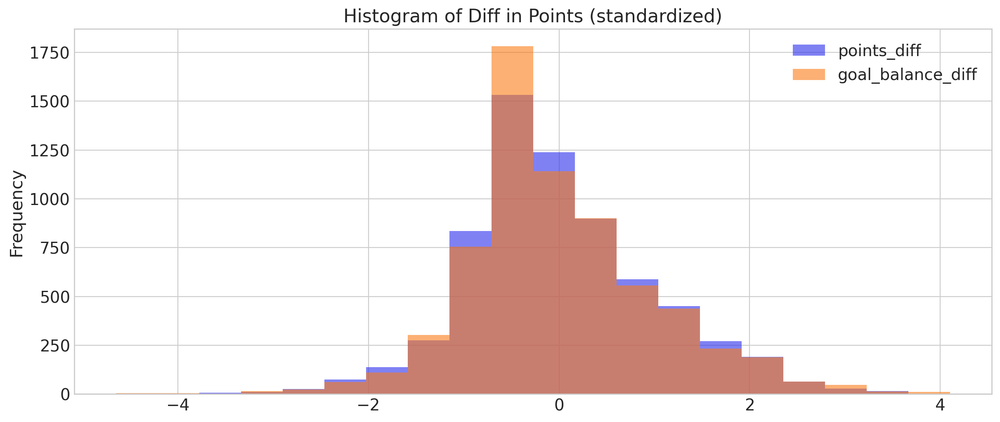

In [7]:
factors_numeric_sdz.plot(
    kind="hist", alpha=0.6, bins=20, title="Histogram of Diff in Points (standardized)"
);

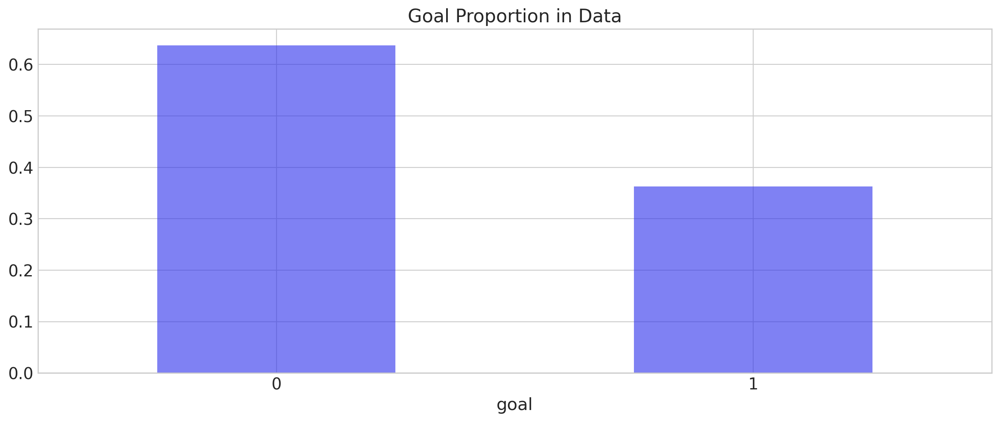

In [8]:
complete_data["goal"].value_counts(normalize=True).plot(
    alpha=0.6, kind="bar", rot=0, title="Goal Proportion in Data"
);

## HSGP Parameters

Coming up with reasons that could impact player perfomance in a non-linear way is pretty easy: they got injured and don't come back well; they didn't prepare well enough during the summer and lag behind in the second half of the season; on the contrary, they prepared too strongly during the summer and are exhausted once Spring arrives, etc.

Accounting for these non-linear effects is key to building a good model, but is also very hard, especially as we don't really know the functional relationship between these effects and the number of goals scored.

That's where GPs come into play! To handle these effects, we'll use the [Hilbert-Space decomposition](https://arxiv.org/abs/2004.11408) of the Gaussian Process (HSGP), which is also [available in PyMC](https://www.pymc.io/projects/docs/en/stable/api/gp/generated/pymc.gp.HSGP.html).

For a primer on this decompositions, we recommend [this tutorial](https://www.pymc.io/projects/examples/en/latest/gaussian_processes/HSGP-Basic.html), as well as this [more advanced tutorial](https://www.pymc.io/projects/examples/en/latest/gaussian_processes/HSGP-Advanced.html).

### How to choose the parameters

HSGP is mainly defined by two parameters, `m` and `c`, respectively the number of basis vectors and the multiplier determining the boundary of the approximation. These parameters are not inferred at runtime, so we have to put a bit of thought into them.

In a nutshell:

- **Increasing `m` helps the HSGP approximate GPs with smaller lengthscales**, at the cost of increasing computational complexity.

- **Increasing `c` helps the HSGP approximate GPs with larger lengthscales**, but may require increasing `m` to compensate for the loss of fidelity at smaller lengthscales.

- When choosing `m` and `c`, it’s important to **consider the locations where you will need to make predictions**, such that they also aren’t affected by the boundary condition.

- **The first basis vector may be unidentified with the intercept**, especially when `c` is large.

### Choosing the approximation parameters

We'll actually fit three different HSGPs, one for each timescale:
- **Long-term**, i.e across seasons, which you can think of as an experience curve. Intuitively, we expect this curve to be smooth, somewhat parabolic, and with a single peak.
- **Medium-term**, i.e across gamedays, which you can think of as capturing the form of a player within a season.
- **Short-term**, i.e across gamedays, which you can think of as a capturing the variation that's not picked up by the first two GPs (almost like an observational noise term).

That means we have 3 GPs, but two scales: season and gameday. What do they look like? We need to know that to choose good enough `m` and `c`.


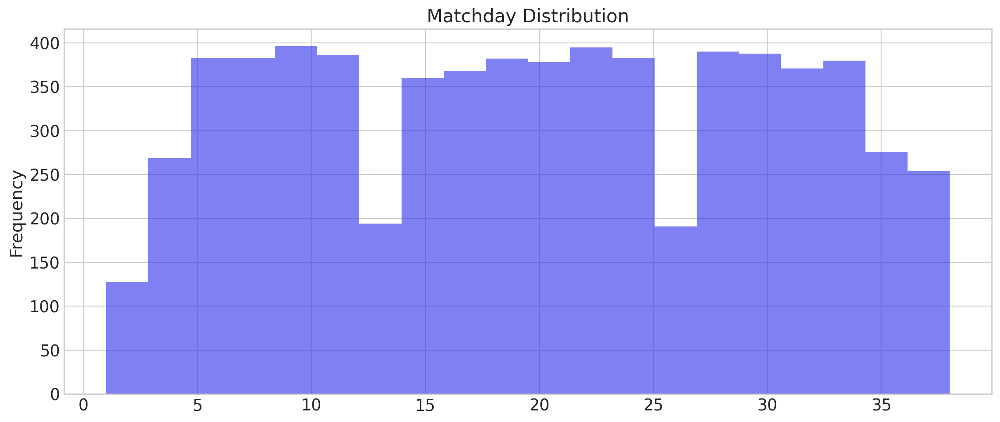

In [9]:
complete_data.matchday.plot(
    kind="hist", alpha=0.6, bins=20, title="Matchday Distribution"
);

Gamedays go from 1 to 38, which is not surprising if you're a soccer fan. Modeling-wise, this means that our short- and medium-term GPs will get inputs in this range.

A reasonable lengthscale range for the short-term GP is between 2 to 5 gamedays, and 15 to 25 for the medium-term GP:

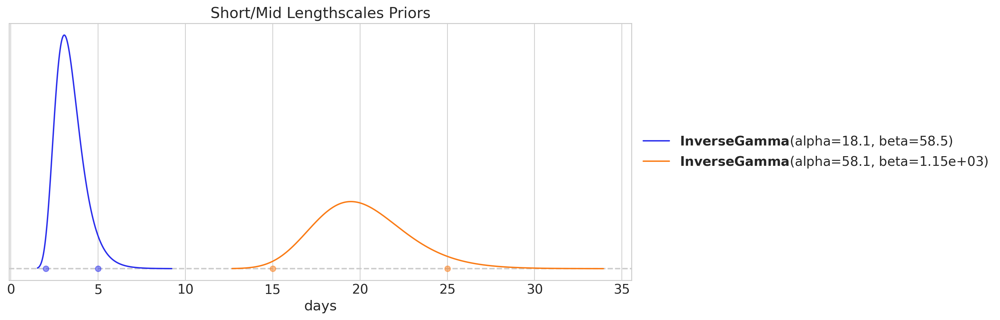

In [10]:
ls_short_dist, _ = pz.maxent(pz.InverseGamma(), 2, 5)
ls_medium_dist, ax = pz.maxent(pz.InverseGamma(), 15, 25)
ax.set(title="Short/Mid Lengthscales Priors", xlabel="days");

This is all the information we need to choose `m` and `c` for our GPs. And the cool thing is that PyMC has a helper function to help us choose them:

In [11]:
m_within, c_within = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[0, complete_data.matchday.max()],
    lengthscale_range=[5, 25],  # nbr of matchdays with autocorrelation
    cov_func="matern52",  # our covariance function
)

print("Recommended smallest number of basis vectors (m):", m_within)
print("Recommended smallest scaling factor (c):", np.round(c_within, 1))

Recommended smallest number of basis vectors (m): 54
Recommended smallest scaling factor (c): 5.4


Now, what about the long-term GP?

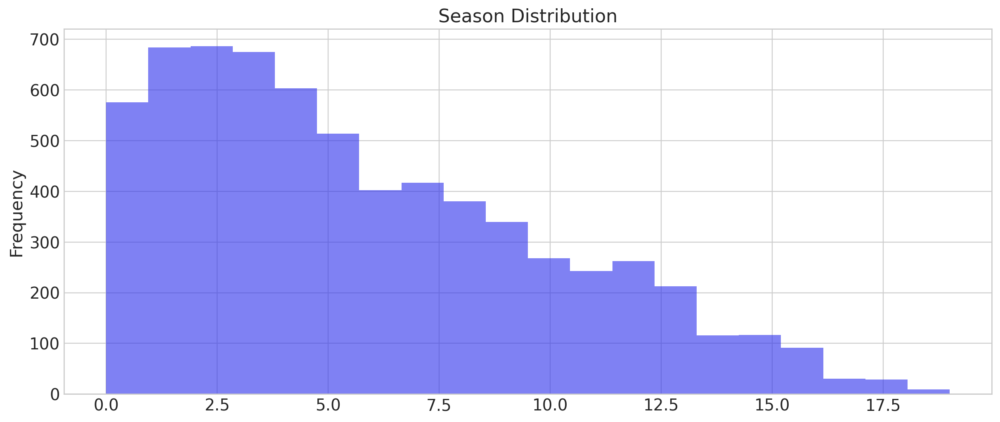

In [12]:
complete_data.season_nbr.plot(
    kind="hist", alpha=0.6, bins=20, title="Season Distribution"
);

That's expected: lots of young players, and only a few experienced ones, sometimes with almost 20 seasons at the top level!

If we expect the last 2 to 6 seasons to still give us information about a player's performance today, the lengthscale would look like this:

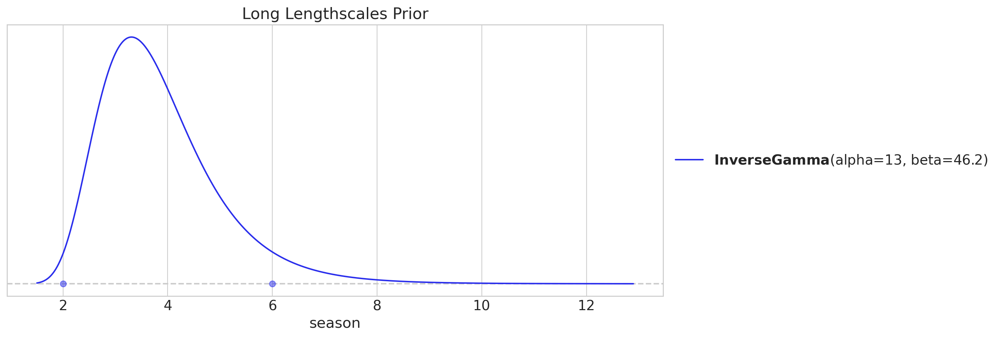

In [13]:
ls_long_dist, ax = pz.maxent(pz.InverseGamma(), 2, 6)
ax.set(title="Long Lengthscales Prior", xlabel="season");

And now we can choose `m` and `c` for our long-term GP:

In [14]:
m_long, c_long = pm.gp.hsgp_approx.approx_hsgp_hyperparams(
    x_range=[0, complete_data.season_nbr.max()],
    lengthscale_range=[2, 6],
    cov_func="matern52",
)

print("Recommended smallest number of basis vectors (m):", m_long)
print("Recommended smallest scaling factor (c):", np.round(c_long, 1))

Recommended smallest number of basis vectors (m): 32
Recommended smallest scaling factor (c): 2.6


We can now implement our PyMC model. It'll be a big one, but we'll take it step by step.

## PyMC Model

First, let's define some variables we'll use throughout our model building process:

In [15]:
player_idx = pd.Categorical(
    complete_data["name_player"], categories=players_ordered
).codes

unique_gamedays = complete_data["matchday"].sort_values().unique()
gameday_idx = pd.Categorical(
    complete_data["matchday"],
    categories=unique_gamedays,
).codes

unique_seasons = complete_data["season_nbr"].unique()

coords = {
    "factor": factors,
    "gameday": unique_gamedays,
    "obs_id": complete_data.index,
    "player": players_ordered,
    "season": unique_seasons,
    "timescale": ["short", "medium", "long"],
}

Then, let's define the data containers for our model:

### Data containers

In [16]:
with pm.Model(coords=coords) as SFM_rlp:
    # Data containers
    factor_data = pm.Data(
        "factor_data", factors_sdz.to_numpy(), dims=("obs_id", "factor")
    )
    gameday_id = pm.Data("gameday_id", gameday_idx, dims="obs_id")
    player_id = pm.Data("player_id", player_idx, dims="obs_id")
    season_id = pm.Data(
        "season_id", complete_data["season_nbr"].to_numpy(), dims="obs_id"
    )
    goals_obs = pm.Data("goals_obs", complete_data["goal"].to_numpy(), dims="obs_id")

### Players' skills

For the priors we use [those recommendations](https://github.com/stan-dev/stan/wiki/Prior-Choice-Recommendations).

 The requested mass is 0.94, but the computed one is 0.811


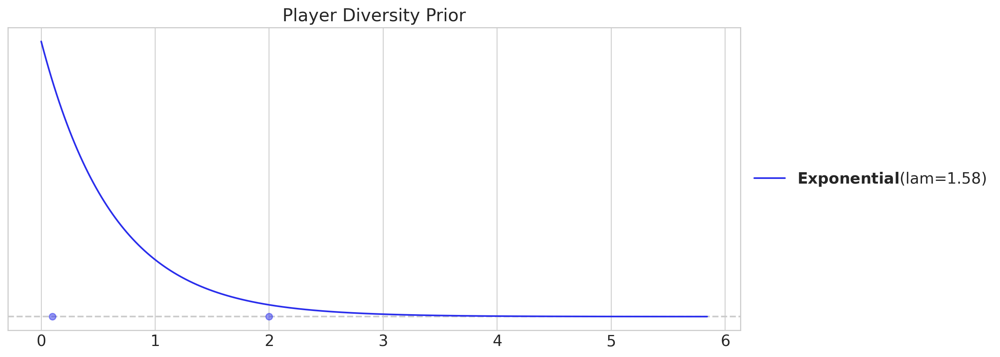

In [17]:
player_diversity_dist, ax = pz.maxent(pz.Exponential(), 0.1, 2)
ax.set(title="Player Diversity Prior");

In [18]:
with SFM_rlp:
    sigma = player_diversity_dist.to_pymc(name="player_diversity")
    player_effect = pm.Normal(
        "player_effect",
        mu=logit(complete_data["goal"].mean()),
        sigma=sigma,
        dims="player",
    )

### HSGPs

#### Defining the HSGPs

In [19]:
with SFM_rlp:
    X_gamedays = pm.Data("X_gamedays", unique_gamedays, dims="gameday")[:, None]
    X_seasons = pm.Data("X_seasons", unique_seasons, dims="season")[:, None]

    ## PC prior on amplitude
    # 1% chance that amplitude > sigmoid(1.1)=0.75%
    alpha_scale, upper_scale = 0.01, 1.1
    amplitude = pm.Exponential(
        "amplitude", lam=-np.log(alpha_scale) / upper_scale, dims="timescale"
    )
    ls = pm.InverseGamma(
        "ls",
        alpha=np.array([ls_short_dist.alpha, ls_medium_dist.alpha, ls_long_dist.alpha]),
        beta=np.array([ls_short_dist.beta, ls_medium_dist.beta, ls_long_dist.beta]),
        dims="timescale",
    )

    # cov matrices
    cov_short = amplitude[0] ** 2 * pm.gp.cov.Matern52(input_dim=1, ls=ls[0])
    cov_medium = amplitude[1] ** 2 * pm.gp.cov.Matern52(input_dim=1, ls=ls[1])
    cov_within = cov_short + cov_medium
    cov_long = amplitude[2] ** 2 * pm.gp.cov.Matern52(input_dim=1, ls=ls[2])

    ## define GPs
    gp_within = pm.gp.HSGP(
        m=[m_within],
        c=c_within,
        cov_func=cov_within,
        drop_first=True,
    )
    f_within = gp_within.prior(
        "f_within",
        X=X_gamedays,
        hsgp_coeffs_dims="basis_coeffs_within",
        gp_dims="gameday",
    )

    ## using .prior_linearized, just for demo
    gp_long = pm.gp.HSGP(m=[m_long], c=c_long, cov_func=cov_long, drop_first=True)
    basis_vectors_long, sqrt_psd_long = gp_long.prior_linearized(X=X_seasons)
    basis_coeffs_long = pm.Normal(
        "basis_coeffs_long", shape=gp_long.n_basis_vectors - 1
    )
    # non-centered parameterization
    f_long = pm.Deterministic(
        "f_long",
        basis_vectors_long @ (basis_coeffs_long * sqrt_psd_long),
        dims="season",
    )

### Regression for player skills

In [20]:
with SFM_rlp:
    alpha = pm.Deterministic(
        "alpha",
        player_effect[player_id] + f_within[gameday_id] + f_long[season_id],
        dims="obs_id",
    )

### Adding team factors

> Partially pooled across teams

In [21]:
with SFM_rlp:
    slope = pm.Normal("slope", sigma=0.25, dims="factor")

### Likelihood

In [22]:
with SFM_rlp:
    # regression
    p = pm.Deterministic(
        "p", pm.math.sigmoid(alpha + pm.math.dot(factor_data, slope)), dims="obs_id"
    )

    # likelihood
    pm.Bernoulli(
        "goals_scored",
        p=p,
        observed=goals_obs,
        dims="obs_id",
    )

## Model graph

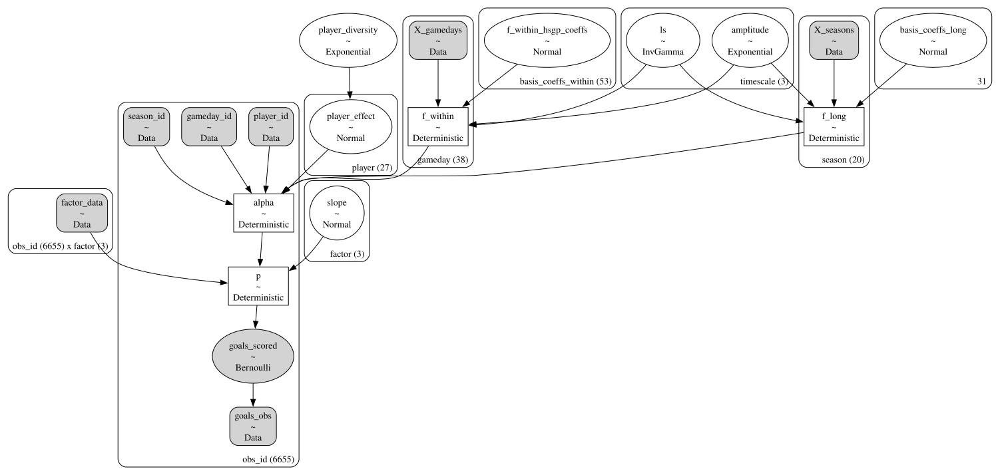

In [23]:
pm.model_to_graphviz(SFM_rlp)

## Prior Predictive Sampling

In [24]:
with SFM_rlp:
    idata = pm.sample_prior_predictive(random_seed=rng)

Sampling: [amplitude, basis_coeffs_long, f_within_hsgp_coeffs, goals_scored, ls, player_diversity, player_effect, slope]


### Prior Probabilities and Goals

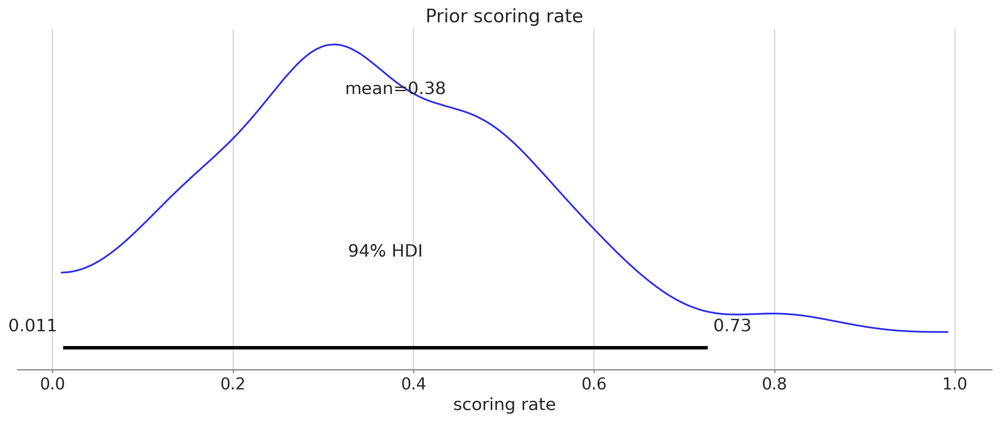

In [25]:
ax = az.plot_posterior(idata.prior.p.sel(obs_id=0))
ax.set(
    xlabel="scoring rate",
    title="Prior scoring rate",
);


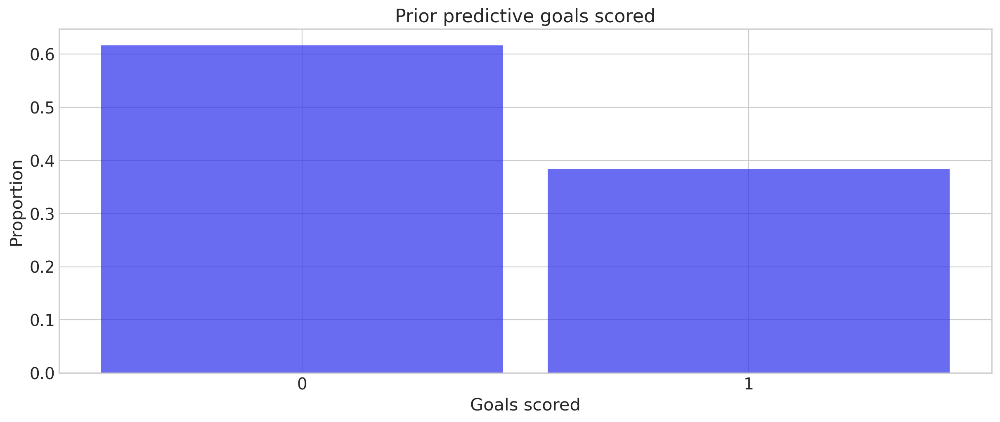

In [26]:
ax = az.plot_dist(
    idata.prior_predictive.goals_scored,
    hist_kwargs={"alpha": 0.7},
)
ax.set(
    xlabel="Goals scored", title="Prior predictive goals scored", ylabel="Proportion"
);


### Prior GPs

In [27]:
f_within_prior = idata.prior["f_within"]
f_long_prior = idata.prior["f_long"]

index = pd.MultiIndex.from_product(
    [unique_seasons, unique_gamedays],
    names=["season_nbr", "gameday"],
)
unique_combinations = pd.DataFrame(index=index).reset_index()

f_long_prior_aligned = f_long_prior.sel(
    season=unique_combinations["season_nbr"].to_numpy()
).rename({"season": "timestamp"})
f_long_prior_aligned["timestamp"] = unique_combinations.index

f_within_prior_aligned = f_within_prior.sel(
    gameday=unique_combinations["gameday"].to_numpy()
).rename({"gameday": "timestamp"})
f_within_prior_aligned["timestamp"] = unique_combinations.index

f_total_prior = f_long_prior_aligned + f_within_prior_aligned

some_draws = rng.choice(f_total_prior.draw, size=20, replace=True)

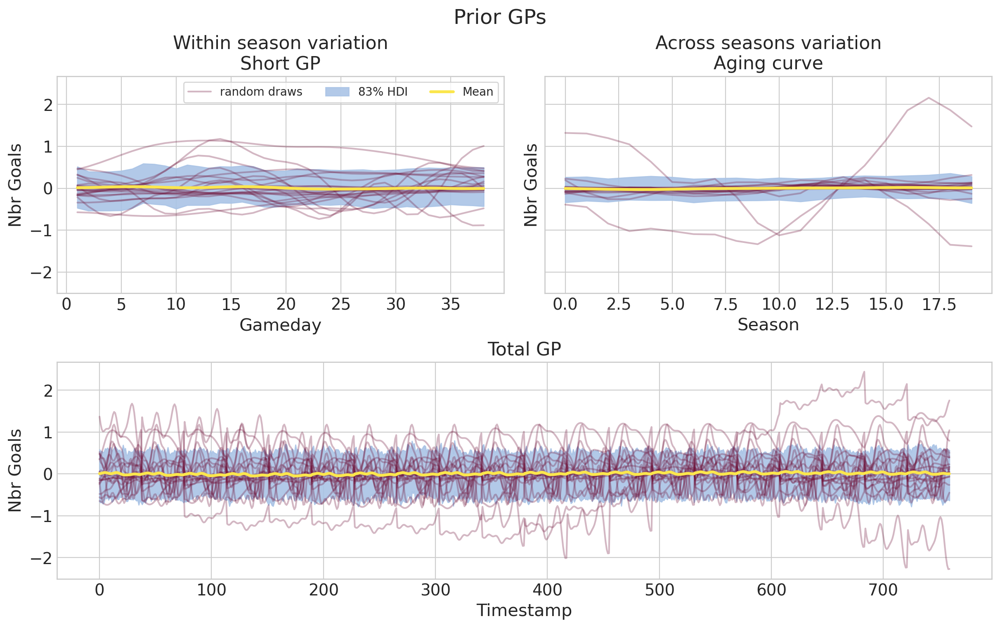

In [28]:
_, axes = plt.subplot_mosaic(
    """
    AB
    CC
    """,
    figsize=(12, 7.5),
    layout="constrained",
    sharey=True,
)

axes["A"].plot(
    f_within_prior.gameday,
    az.extract(f_within_prior)["f_within"].isel(sample=0),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
    label="random draws",
)
axes["A"].plot(
    f_within_prior.gameday,
    az.extract(f_within_prior)["f_within"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_within_prior.gameday,
    y=f_within_prior,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9, "label": r"$83\%$ HDI"},
    ax=axes["A"],
    smooth=False,
)
axes["A"].plot(
    f_within_prior.gameday,
    f_within_prior.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
    label="Mean",
)
axes["A"].set(
    xlabel="Gameday", ylabel="Nbr Goals", title="Within season variation\nShort GP"
)
axes["A"].legend(fontsize=10, frameon=True, ncols=3)

axes["B"].plot(
    f_long_prior.season,
    az.extract(f_long_prior)["f_long"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_long_prior.season,
    y=f_long_prior,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9},
    ax=axes["B"],
    smooth=False,
)
axes["B"].plot(
    f_long_prior.season,
    f_long_prior.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
)
axes["B"].set(
    xlabel="Season", ylabel="Nbr Goals", title="Across seasons variation\nAging curve"
)

axes["C"].plot(
    f_total_prior.timestamp,
    az.extract(f_total_prior)["x"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_total_prior.timestamp,
    y=f_total_prior,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9},
    ax=axes["C"],
    smooth=False,
)
axes["C"].plot(
    f_total_prior.timestamp,
    f_total_prior.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
)
axes["C"].set(xlabel="Timestamp", ylabel="Nbr Goals", title="Total GP")
plt.suptitle("Prior GPs", fontsize=18);

## Sampling and convergence checks

In [29]:
with SFM_rlp:
    idata.extend(pm.sample(nuts_sampler="numpyro", random_seed=rng, target_accept=0.95))
    idata.extend(
        pm.sample_posterior_predictive(
            idata, random_seed=rng, compile_kwargs={"mode": "NUMBA"}
        )
    )

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

There were 2 divergences after tuning. Increase `target_accept` or reparameterize.
Sampling: [goals_scored]


Output()

In [30]:
ess = az.ess(idata.posterior)
ess.quantile([0.01, 0.5, 0.99]).to_dataframe().astype(int).style.background_gradient(
    axis=None, cmap="RdYlGn"
)

,player_effect,f_within_hsgp_coeffs,basis_coeffs_long,slope,player_diversity,amplitude,ls,f_within,f_long,alpha,p
quantile,,,,,,,,,,,
0.010000,878,2844,2024,3371,2124,815,3525,720,1302,3551,3651
0.500000,1526,5718,5365,3394,2124,1239,4588,807,2056,5512,5399
0.990000,2660,7136,6380,4775,2124,2364,6030,1335,4427,6934,6812


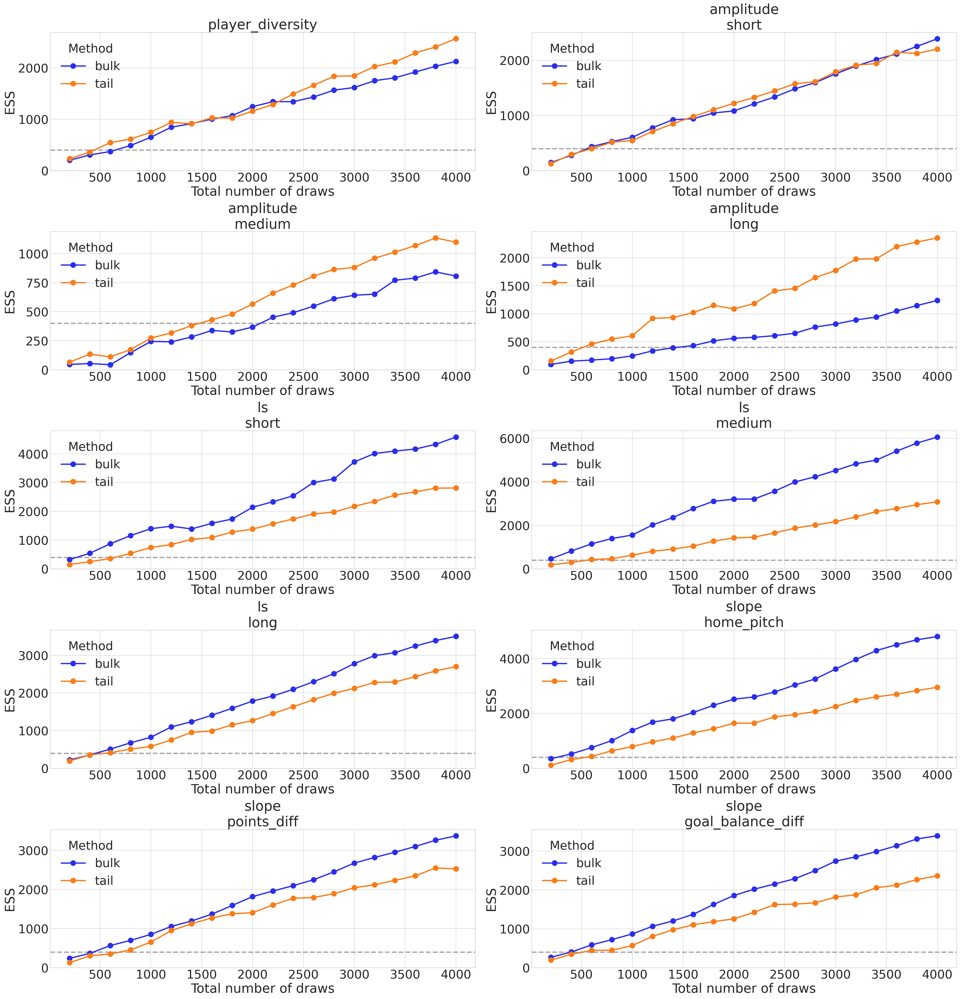

In [31]:
az.plot_ess(
    idata,
    kind="evolution",
    var_names=[RV.name for RV in SFM_rlp.free_RVs if RV.size.eval() <= 3],
    grid=(5, 2),
    textsize=25,
);

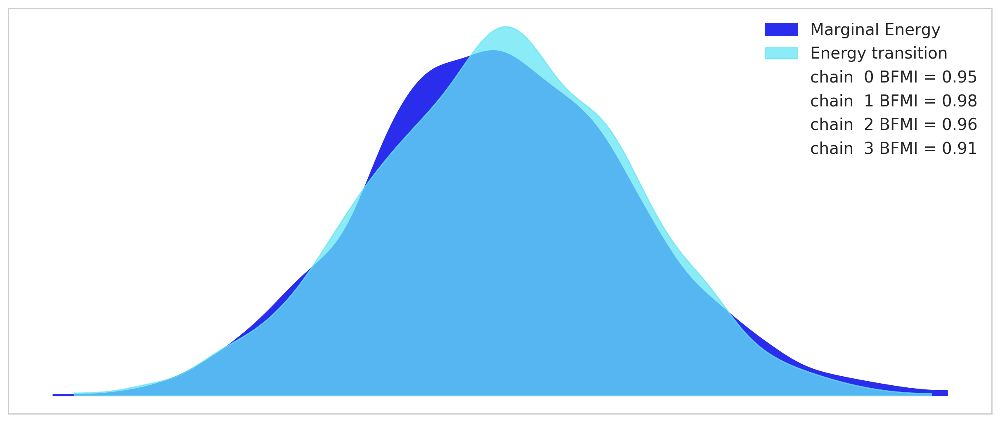

In [32]:
az.plot_energy(idata);

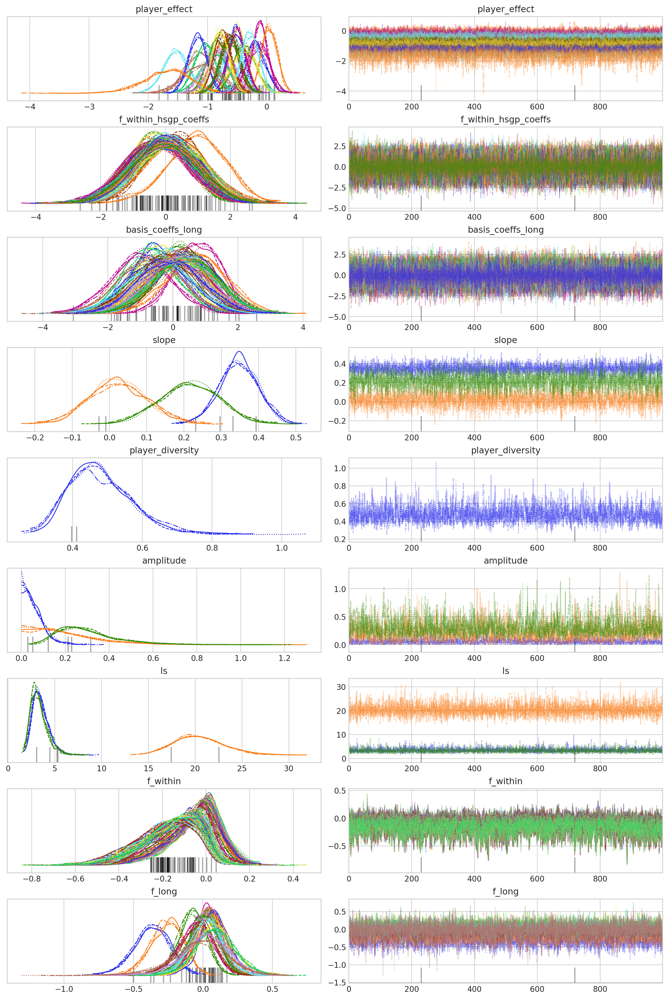

In [33]:
az.plot_trace(
    idata,
    var_names=["~alpha", "~p"],
);

## Posterior parameters

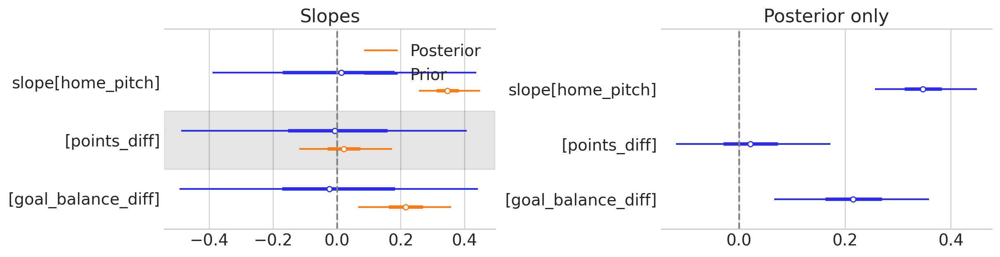

In [34]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 3),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names=["slope"],
    combined=True,
    ax=axes["A"],
)
axes["A"].axvline(c="grey", ls="--")
axes["A"].set(title="Slopes")

az.plot_forest(
    idata,
    var_names=["slope"],
    combined=True,
    ax=axes["B"],
)
axes["B"].axvline(c="grey", ls="--")
axes["B"].set(title="Posterior only");

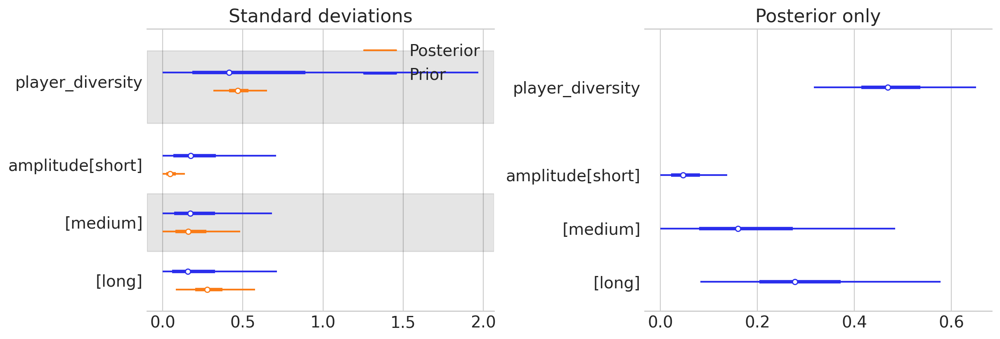

In [35]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 4),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names=["diversity", "amplitude", "sd_", "_sigma"],
    combined=True,
    filter_vars="regex",
    ax=axes["A"],
)
axes["A"].set(title="Standard deviations")

az.plot_forest(
    idata,
    var_names=["diversity", "amplitude", "sd_", "_sigma"],
    combined=True,
    filter_vars="regex",
    ax=axes["B"],
)
axes["B"].set(title="Posterior only");

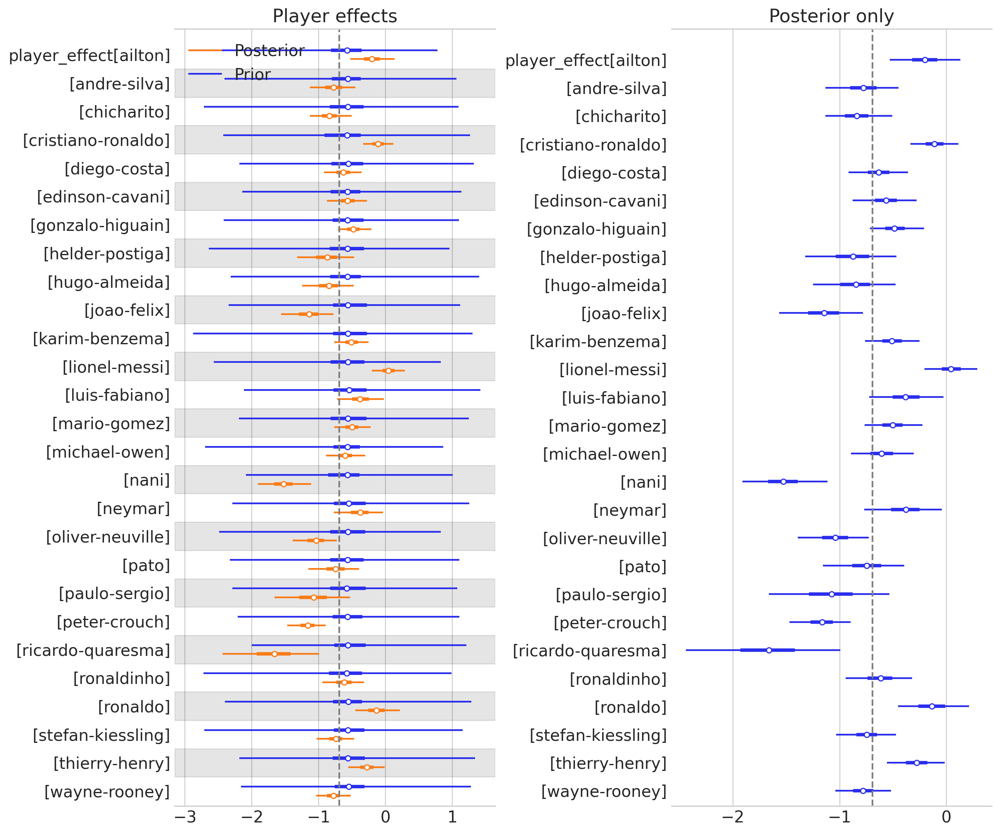

In [36]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 10),
    layout="constrained",
)

players_mean = idata.posterior.player_effect.mean()
az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names="player_effect",
    combined=True,
    ax=axes["A"],
)
axes["A"].axvline(x=players_mean, c="grey", ls="--")
axes["A"].set(title="Player effects")

az.plot_forest(
    idata,
    var_names="player_effect",
    combined=True,
    ax=axes["B"],
)
axes["B"].axvline(x=players_mean, c="grey", ls="--")
axes["B"].set(title="Posterior only");

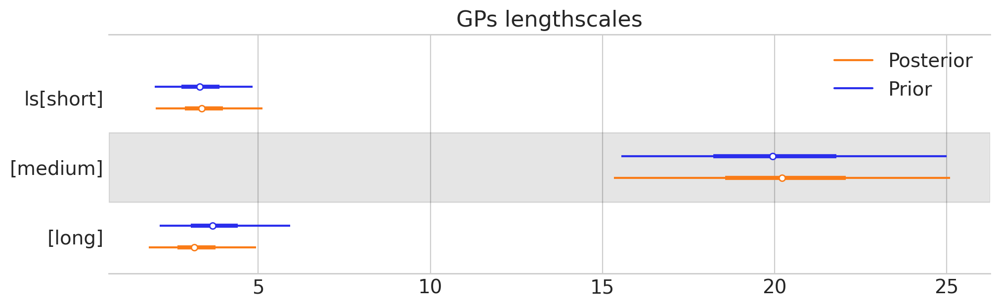

In [37]:
ax = az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names="ls",
    combined=True,
    figsize=(10, 3),
)
ax[0].set(title="GPs lengthscales");

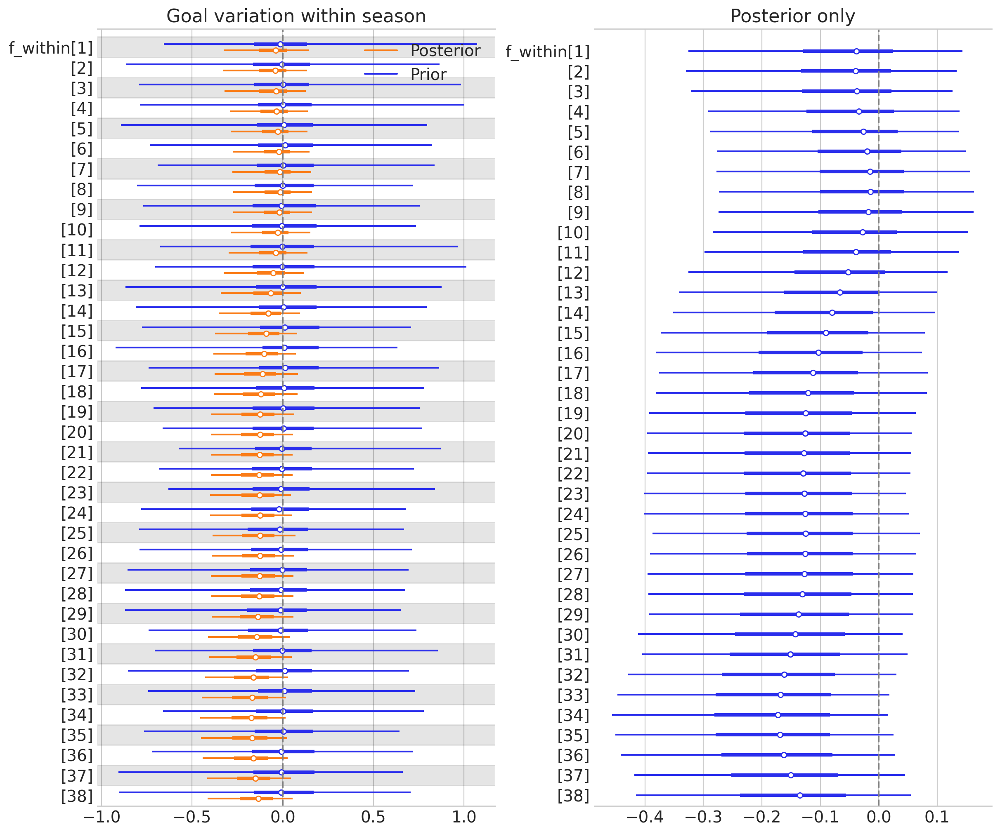

In [38]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 10),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names="f_within",
    combined=True,
    ax=axes["A"],
)
axes["A"].axvline(c="grey", ls="--")
axes["A"].set(title="Goal variation within season")

az.plot_forest(
    idata,
    var_names="f_within",
    combined=True,
    ax=axes["B"],
)
axes["B"].axvline(c="grey", ls="--")
axes["B"].set(title="Posterior only");

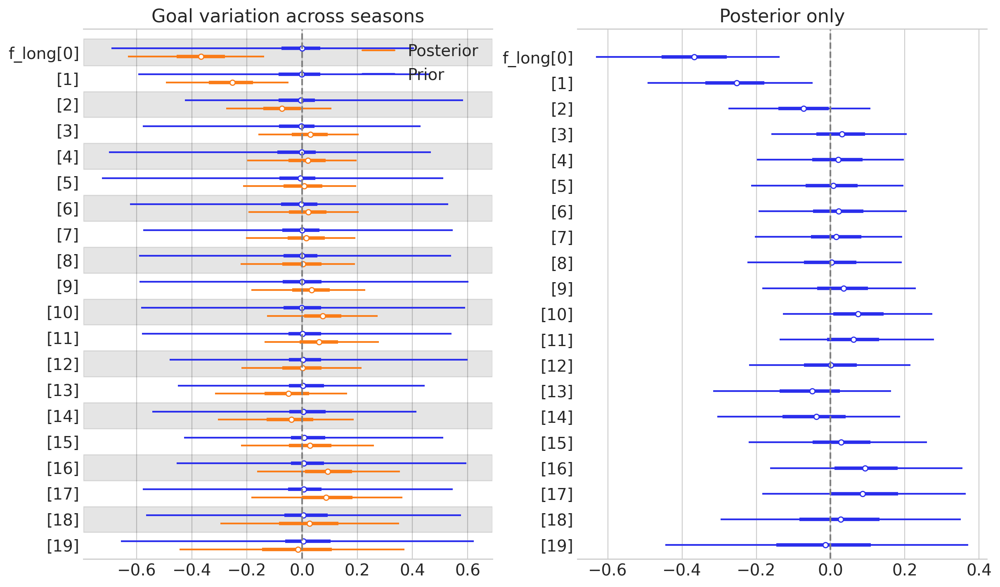

In [39]:
_, axes = plt.subplot_mosaic(
    """
    AB
    """,
    figsize=(12, 7),
    layout="constrained",
)

az.plot_forest(
    [idata.prior, idata.posterior],
    model_names=["Prior", "Posterior"],
    var_names="f_long",
    combined=True,
    ax=axes["A"],
)
axes["A"].axvline(c="grey", ls="--")
axes["A"].set(title="Goal variation across seasons")

az.plot_forest(
    idata,
    var_names="f_long",
    combined=True,
    ax=axes["B"],
)
axes["B"].axvline(c="grey", ls="--")
axes["B"].set(title="Posterior only");

## Posterior predictive checks

### Posterior Probabilities and Goals

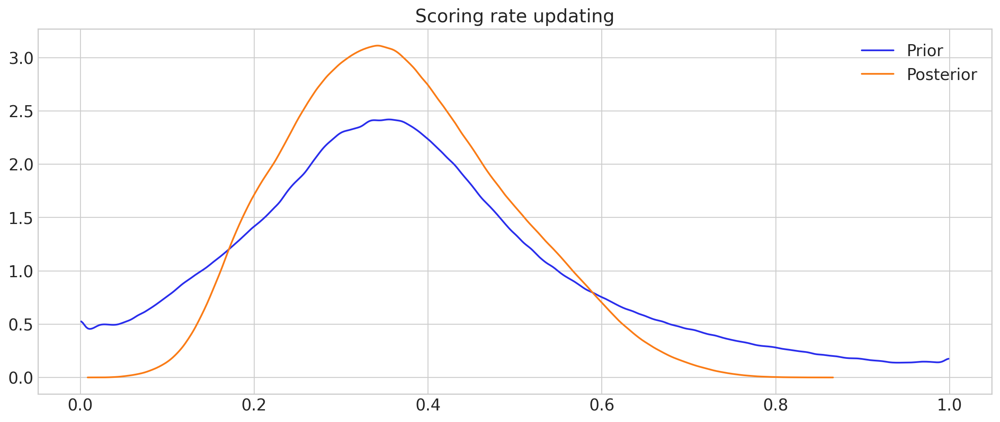

In [40]:
ax = az.plot_dist(idata.prior.p, label="Prior")
az.plot_dist(idata.posterior.p, ax=ax, color="C1", label="Posterior")
ax.set(title="Scoring rate updating");

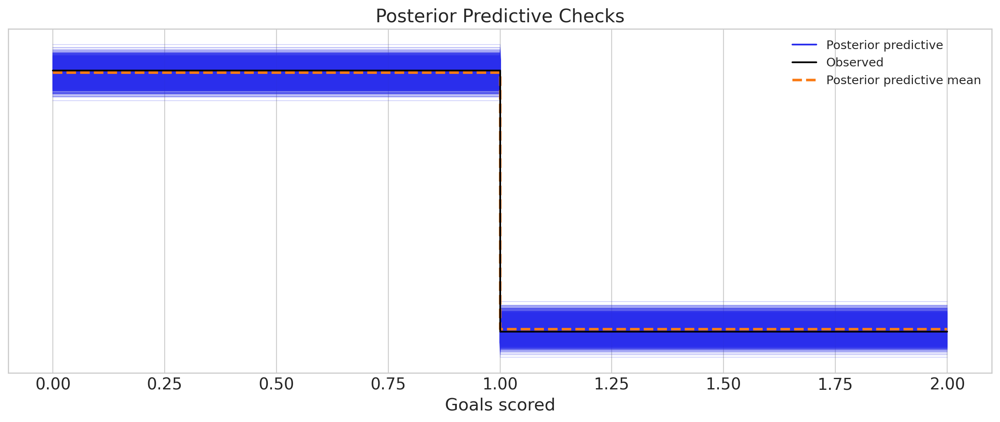

In [41]:
ax = az.plot_ppc(idata)
ax.set(xlabel="Goals scored", title="Posterior Predictive Checks");

In [42]:
mindex_coords_original = xr.Coordinates.from_pandas_multiindex(
    complete_data.set_index(["name_player", "season", "matchday"]).index,
    "obs_id",
)
idata.posterior = idata.posterior.assign_coords(mindex_coords_original)
idata.posterior_predictive = idata.posterior_predictive.assign_coords(
    mindex_coords_original
)

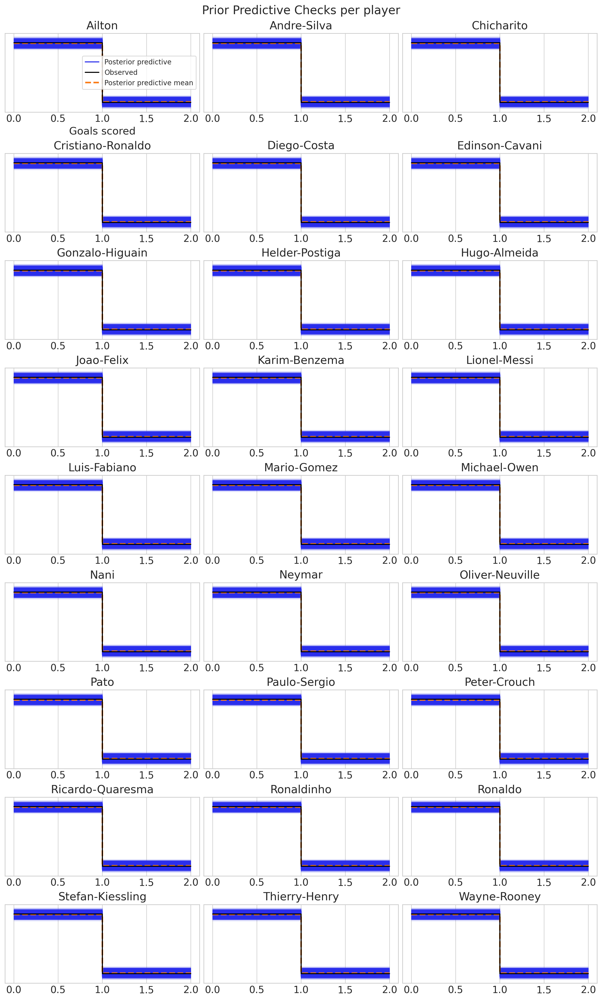

In [43]:
_, axes = plt.subplots(9, 3, figsize=(12, 20))
axes = axes.flatten()

for player, (i, ax) in zip(players_ordered, enumerate(axes)):
    idata_plot = idata.sel(name_player=player)
    az.plot_ppc(idata_plot, ax=ax)
    ax.set(xlabel="Goals scored", yticklabels=[], title=player.title())
    if i > 0:
        ax.get_legend().remove()
        ax.set(xlabel="")
    else:
        ax.legend(fontsize=10, frameon=True)

plt.suptitle("Prior Predictive Checks per player", fontsize=17);

## Performance evolution through time

### Posterior GPs

In [44]:
f_long_post = idata.posterior["f_long"]
f_within_post = idata.posterior["f_within"]

f_long_post_aligned = f_long_post.sel(
    season=unique_combinations["season_nbr"].to_numpy()
).rename({"season": "timestamp"})
f_long_post_aligned["timestamp"] = unique_combinations.index

f_within_post_aligned = f_within_post.sel(
    gameday=unique_combinations["gameday"].to_numpy()
).rename({"gameday": "timestamp"})
f_within_post_aligned["timestamp"] = unique_combinations.index

f_total_post = f_long_post_aligned + f_within_post_aligned

some_draws = rng.choice(4000, size=20, replace=True)

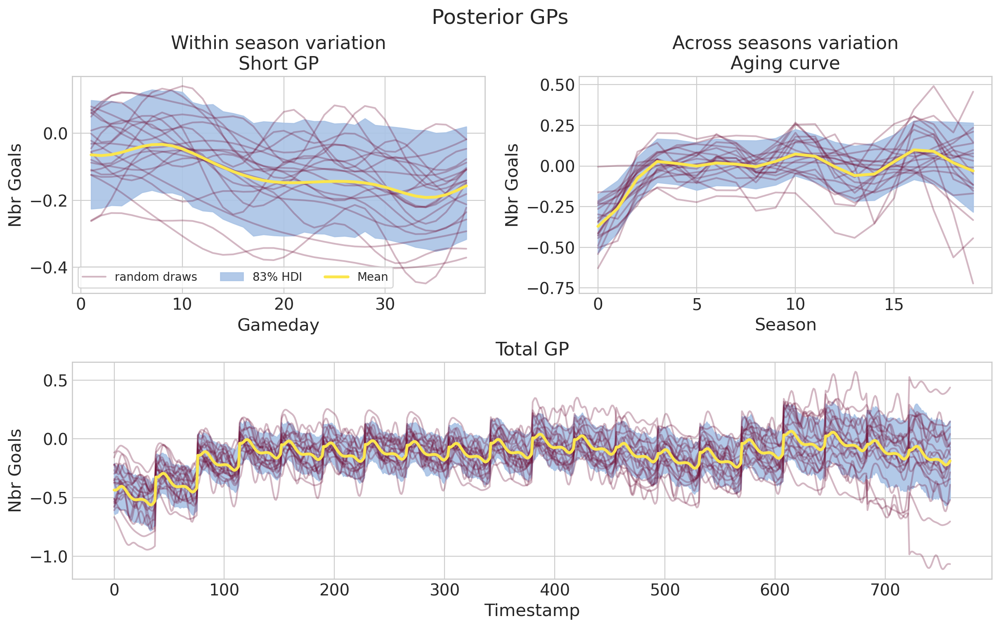

In [45]:
_, axes = plt.subplot_mosaic(
    """
    AB
    CC
    """,
    figsize=(12, 7.5),
    layout="constrained",
)

axes["A"].plot(
    f_within_post.gameday,
    az.extract(f_within_post)["f_within"].isel(sample=0),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
    label="random draws",
)
axes["A"].plot(
    f_within_post.gameday,
    az.extract(f_within_post)["f_within"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_within_post.gameday,
    y=f_within_post,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9, "label": r"$83\%$ HDI"},
    ax=axes["A"],
    smooth=False,
)
axes["A"].plot(
    f_within_post.gameday,
    f_within_post.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
    label="Mean",
)
axes["A"].set(
    xlabel="Gameday", ylabel="Nbr Goals", title="Within season variation\nShort GP"
)
axes["A"].legend(fontsize=10, frameon=True, ncols=3)

axes["B"].plot(
    f_long_post.season,
    az.extract(f_long_post)["f_long"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_long_post.season,
    y=f_long_post,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9},
    ax=axes["B"],
    smooth=False,
)
axes["B"].plot(
    f_long_post.season,
    f_long_post.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
)
axes["B"].set(
    xlabel="Season", ylabel="Nbr Goals", title="Across seasons variation\nAging curve"
)

axes["C"].plot(
    f_total_post.timestamp,
    az.extract(f_total_post)["x"].isel(sample=some_draws),
    color="#70133A",
    alpha=0.3,
    lw=1.5,
)
az.plot_hdi(
    x=f_total_post.timestamp,
    y=f_total_post,
    hdi_prob=0.83,
    color="#AAC4E6",
    fill_kwargs={"alpha": 0.9},
    ax=axes["C"],
    smooth=False,
)
axes["C"].plot(
    f_total_post.timestamp,
    f_total_post.mean(("chain", "draw")),
    color="#FBE64D",
    lw=2.5,
)
axes["C"].set(xlabel="Timestamp", ylabel="Nbr Goals", title="Total GP")
plt.suptitle("Posterior GPs", fontsize=18);

### Goal Probabilities per Season

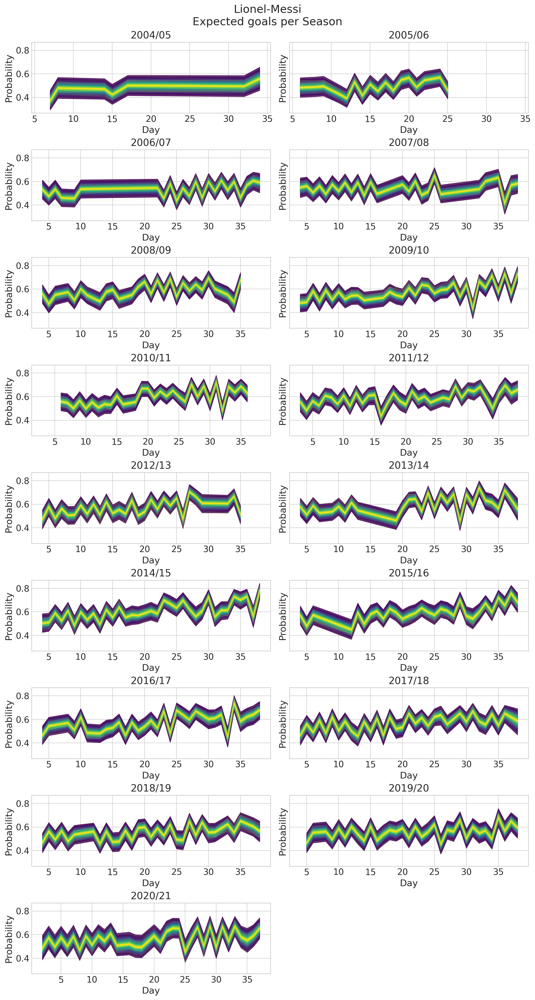

In [46]:
PLAYER = "lionel-messi"
player_probs_post = idata.posterior.p.sel(name_player=PLAYER)

cols = 2
player_unique_seasons = np.unique(player_probs_post.season)
num_seasons = len(player_unique_seasons)
rows = (num_seasons + cols - 1) // cols

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(12, 2.5 * rows),
    layout="constrained",
    sharey=True,
    sharex="row",
)
axes = axes.flatten()

for season, (i, ax) in zip(player_unique_seasons, enumerate(axes)):
    dates = player_probs_post.sel(season=season)["matchday"]
    y_plot = player_probs_post.sel(season=season)
    obs_plot = (
        complete_data.loc[
            (complete_data["name_player"] == PLAYER)
            & (complete_data["season"] == season),
            "goal",
        ]
        .value_counts(normalize=True)
        .sort_index()
    )

    pm.gp.util.plot_gp_dist(
        x=dates.to_numpy(),
        samples=az.extract(y_plot, var_names="p").to_numpy().T,
        ax=ax,
        palette="viridis",
    )
    ax.set(xlabel="Day", ylabel="Probability", title=f"{season}")

# remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle(f"{PLAYER.title()}\nExpected goals per Season", fontsize=18);

## Packages versions

In [47]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Sat Nov 02 2024

Python implementation: CPython
Python version       : 3.12.7
IPython version      : 8.29.0

xarray    : 2024.10.0
matplotlib: 3.9.2
pymc      : 5.17.0
numpy     : 1.26.4
arviz     : 0.20.0
preliz    : 0.11.0
sklearn   : 1.5.2
pandas    : 2.2.3

Watermark: 2.5.0

